<a href="https://colab.research.google.com/github/naaz-719/Music-Genre-Classifier/blob/main/Music_Genre_Classifier.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install python_speech_features

In [ ]:
!pip install lime shap scikit-learn pandas

In [ ]:
!pip install kagglehub


In [ ]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("andradaolteanu/gtzan-dataset-music-genre-classification")

print("Path to dataset files:", path)

Path to dataset files: /kaggle/input/gtzan-dataset-music-genre-classification


In [ ]:
#Import and setup
import numpy as np
import pandas as pd
import pandas as pd
import matplotlib.pyplot as plt
import scipy.io.wavfile as wav
from python_speech_features import mfcc
import seaborn as sns
import librosa.display
import librosa
from tempfile import TemporaryFile
from sklearn.preprocessing import normalize

import os
import math
import pickle
import random
import operator


import math
from PIL import Image
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers

# Additional libraries for data preprocessing and visualization
import cv2
from sklearn.model_selection import train_test_split


In [ ]:
#To download the dataset correctrly

dataset_path = kagglehub.dataset_download("andradaolteanu/gtzan-dataset-music-genre-classification")

print("✅ Dataset downloaded.")
print("📁 Path to dataset files:", dataset_path)

✅ Dataset downloaded.
📁 Path to dataset files: /kaggle/input/gtzan-dataset-music-genre-classification


In [ ]:
# Set working directory to dataset folder
# os.chdir(dataset_path) # No need to change the working directory

# Path to audio and metadata
audio_data_path = os.path.join(dataset_path, "genres_original")
csv_file_path = os.path.join(dataset_path, "features_30_sec.csv") # This path seems incorrect. Let's find the correct path.

# Load CSV metadata
# music_data = pd.read_csv(csv_file_path) # Commenting out for now
# music_data.head() # Commenting out for now

# Let's list the files in the dataset directory to find the correct path
print("Files in dataset directory:")
for root, dirs, files in os.walk(dataset_path):
    for name in files:
        print(os.path.join(root, name))

Files in dataset directory:
/kaggle/input/gtzan-dataset-music-genre-classification/Data/features_3_sec.csv
/kaggle/input/gtzan-dataset-music-genre-classification/Data/features_30_sec.csv
/kaggle/input/gtzan-dataset-music-genre-classification/Data/images_original/disco/disco00005.png
/kaggle/input/gtzan-dataset-music-genre-classification/Data/images_original/disco/disco00057.png
/kaggle/input/gtzan-dataset-music-genre-classification/Data/images_original/disco/disco00020.png
/kaggle/input/gtzan-dataset-music-genre-classification/Data/images_original/disco/disco00072.png
/kaggle/input/gtzan-dataset-music-genre-classification/Data/images_original/disco/disco00040.png
/kaggle/input/gtzan-dataset-music-genre-classification/Data/images_original/disco/disco00043.png
/kaggle/input/gtzan-dataset-music-genre-classification/Data/images_original/disco/disco00010.png
/kaggle/input/gtzan-dataset-music-genre-classification/Data/images_original/disco/disco00071.png
/kaggle/input/gtzan-dataset-music-gen

In [ ]:
#To find the count of the Genre

# Correct CSV path
csv_file_path = os.path.join(dataset_path, "Data", "features_30_sec.csv")

# Load it into a DataFrame
music_data = pd.read_csv(csv_file_path)

# Now this will work:
music_data['label'].value_counts()


,count
label,
blues,100
classical,100
country,100
disco,100
hiphop,100
jazz,100
metal,100
pop,100
reggae,100


**Exploratory Data Analysis**

In [ ]:
import librosa.display
import librosa
from importlib import reload
plt=reload(plt)

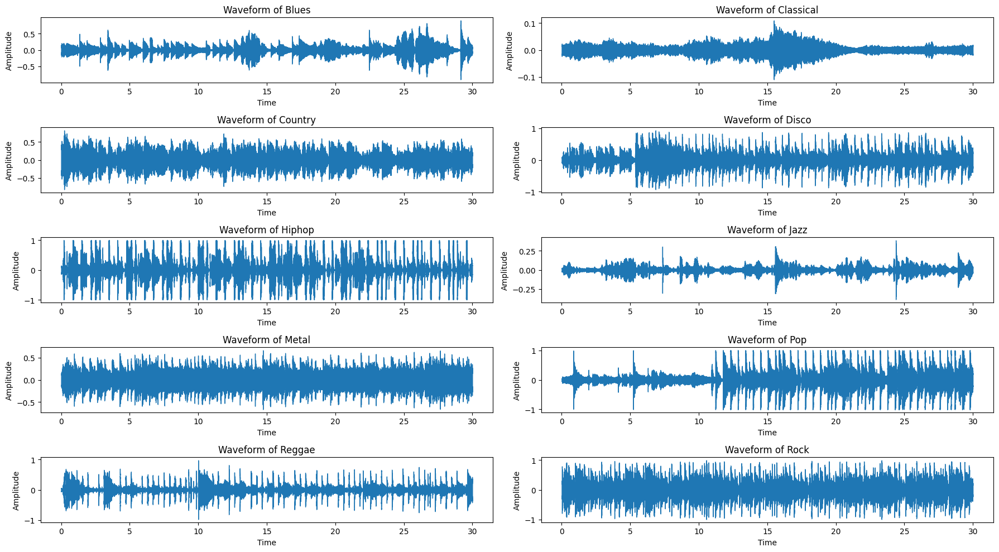

In [ ]:
# Use the correct base path from kagglehub
base_path = os.path.join(dataset_path, "Data", "genres_original")

# List of genre folders
genres = ['blues', 'classical', 'country', 'disco', 'hiphop',
          'jazz', 'metal', 'pop', 'reggae', 'rock']

# Create a figure for plotting
plt.figure(figsize=(18, 10))

# Loop through each genre and plot the waveform
for i, genre in enumerate(genres):
    genre_folder = os.path.join(base_path, genre)
    audio_files = os.listdir(genre_folder)

    if audio_files:  # Only proceed if files are present
        path = os.path.join(genre_folder, audio_files[0])

        plt.subplot(5, 2, i + 1)
        x, sr = librosa.load(path, duration=30)
        librosa.display.waveshow(x, sr=sr)

        plt.xlabel('Time')
        plt.ylabel('Amplitude')
        plt.title(f'Waveform of {genre.capitalize()}')

plt.tight_layout()
plt.show()


## **Heatmap**

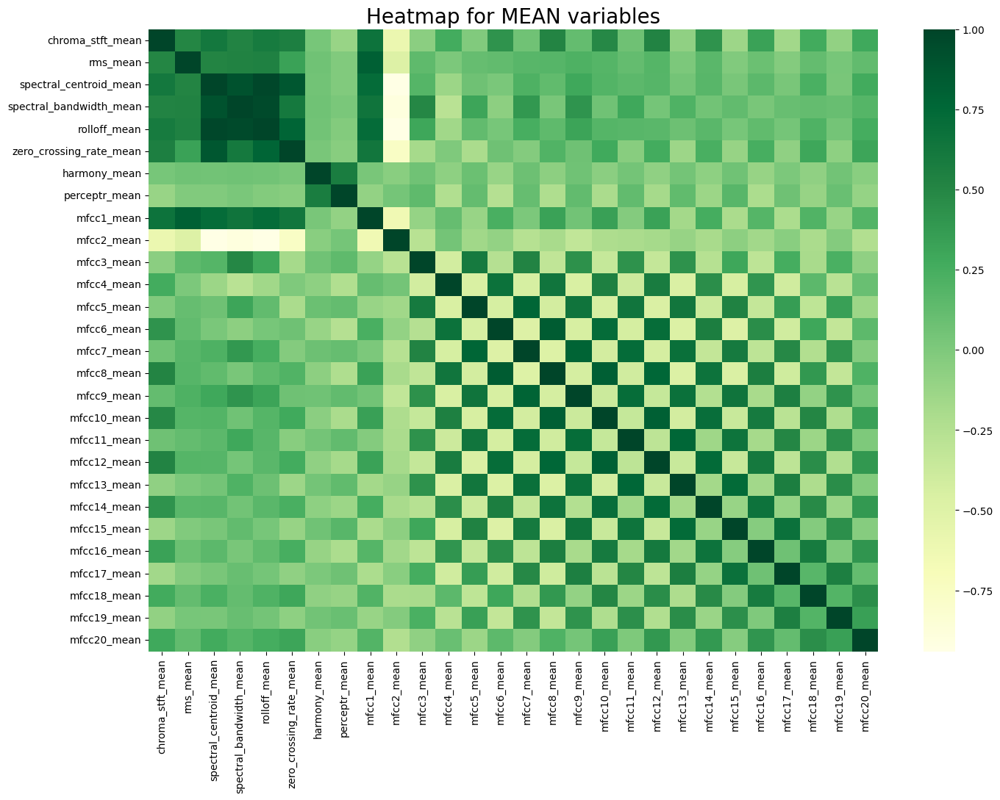

In [ ]:
# Computing the Correlation Matrix
spike_cols = [col for col in music_data.columns if 'mean' in col]

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(16, 11));

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(music_data[spike_cols].corr(), cmap='YlGn')

plt.title('Heatmap for MEAN variables', fontsize = 20)
plt.xticks(fontsize = 10)
plt.yticks(fontsize = 10)
plt.show()

### **SPECTOGRAM**

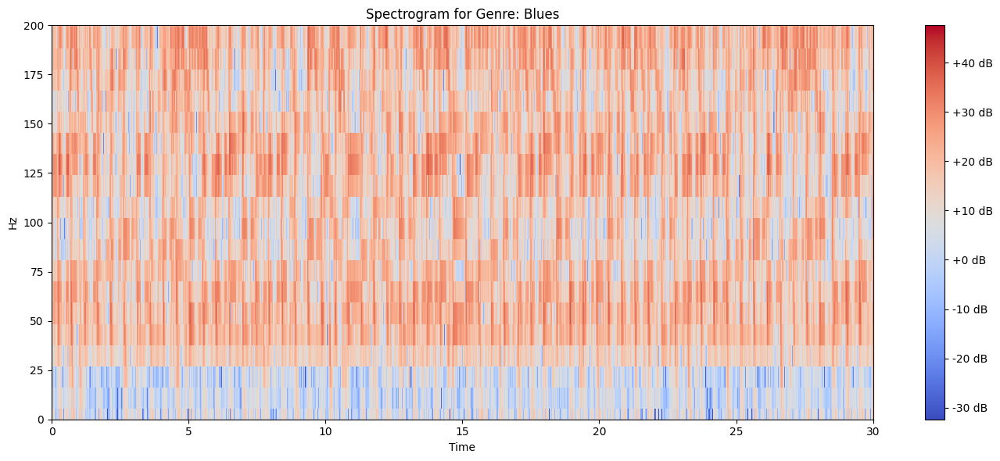

In [ ]:
# Correct path to the audio file in the kagglehub-downloaded dataset
audio_file = os.path.join(dataset_path, "Data", "genres_original", "blues", "blues.00000.wav")

# Load the audio
data, sr = librosa.load(audio_file)

# Compute STFT
stft = librosa.stft(data)
stft_db = librosa.amplitude_to_db(abs(stft))

# Plot spectrogram
plt.figure(figsize=(14, 6))
librosa.display.specshow(stft_db, sr=sr, x_axis='time', y_axis='hz')
plt.ylim(0, 200)  # Focus on low frequencies
plt.title('Spectrogram for Genre: Blues')
plt.colorbar(format='%+2.0f dB')
plt.tight_layout()
plt.show()


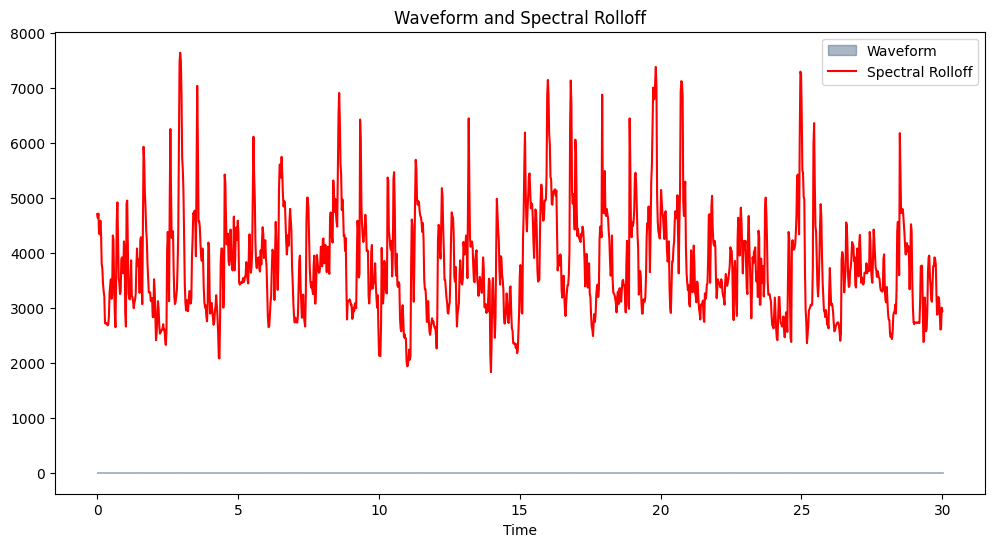

In [ ]:
import matplotlib.pyplot as plt
import librosa.display

spectral_rolloff = librosa.feature.spectral_rolloff(y=data, sr=sr)[0]

plt.figure(figsize=(12, 6))
librosa.display.waveshow(data, sr=sr, alpha=0.4, color="#2B4F72", label='Waveform')
plt.plot(librosa.times_like(spectral_rolloff), spectral_rolloff, color='r', label='Spectral Rolloff')
plt.legend()
plt.title("Waveform and Spectral Rolloff")
plt.show()


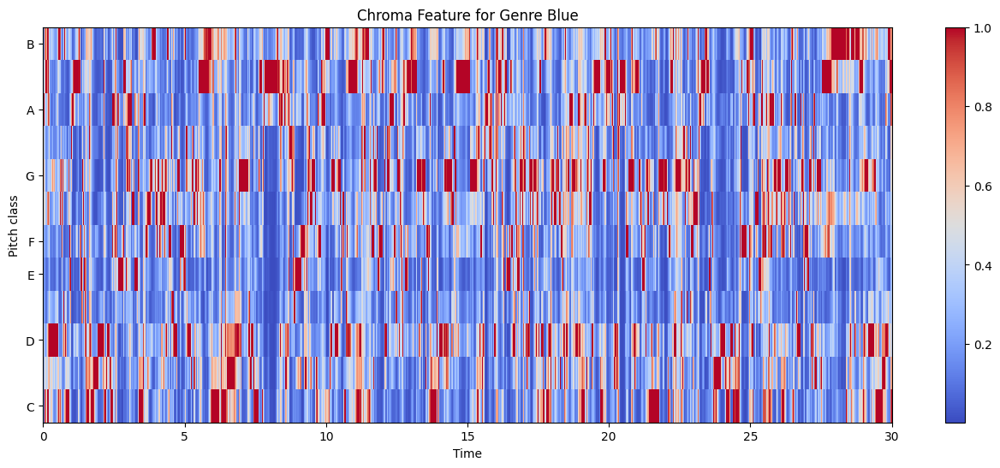

In [ ]:

chroma = librosa.feature.chroma_stft(y = data, sr = sr)
plt.figure(figsize = (16,6))
librosa.display.specshow(chroma, sr = sr, x_axis='time', y_axis='chroma', cmap='coolwarm')
plt.colorbar()
plt.title('Chroma Feature for Genre Blue')
plt.show()

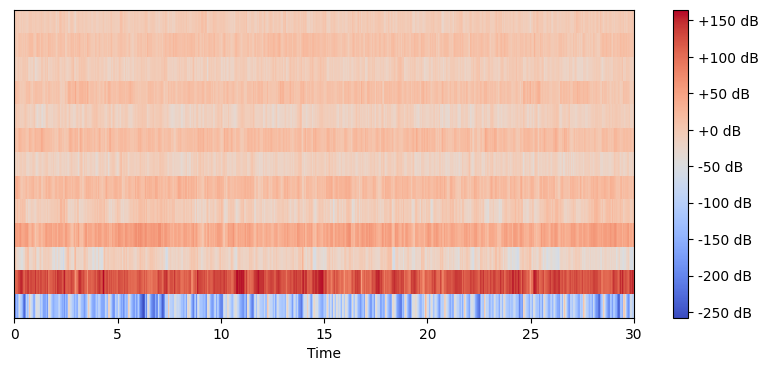

In [ ]:
mfccs = librosa.feature.mfcc(y=data, sr=sr, n_mfcc=13)

# Display the MFCCs
plt.figure(figsize=(10, 4))
librosa.display.specshow(mfccs, x_axis='time', sr=sr)
plt.colorbar(format='%+2.0f dB')
plt.show()

# **KNN** : To find the distance between the 2 vectors

In [ ]:
def getNeighbors(trainingSet, instance, k):
    distances = []
    for x in range (len(trainingSet)):
        dist = distance(trainingSet[x], instance, k )+ distance(instance, trainingSet[x], k)
        distances.append((trainingSet[x][2], dist))
    distances.sort(key=operator.itemgetter(1))
    neighbors = []
    for x in range(k):
        neighbors.append(distances[x][0])
    return neighbors

In [ ]:
#Identify the nearest neighbours

def nearestClass(neighbors):
    classVote = {}

    for x in range(len(neighbors)):
        response = neighbors[x]
        if response in classVote:
            classVote[response]+=1
        else:
            classVote[response]=1

    sorter = sorted(classVote.items(), key = operator.itemgetter(1), reverse=True)
    return sorter[0][0]

In [ ]:
#Define a function for model evaluation


def getAccuracy(testSet, predictions):
    correct = 0
    for x in range (len(testSet)):
        if testSet[x][-1]==predictions[x]:
            correct+=1
    return 1.0*correct/len(testSet)

In [ ]:
import os

root_path = '/kaggle/input/gtzan-dataset-music-genre-classification'
print("Root contents:", os.listdir(root_path))


Root contents: ['Data']


In [ ]:
audio_data_path = os.path.join(root_path, 'Data', 'genres_original')
print("Genres available:", os.listdir(audio_data_path))


Genres available: ['disco', 'metal', 'reggae', 'blues', 'rock', 'classical', 'jazz', 'hiphop', 'country', 'pop']


In [ ]:
import os
import pickle
import numpy as np
import scipy.io.wavfile as wav
from python_speech_features import mfcc

# Correct root path for GTZAN dataset inside Kaggle environment
audio_data_path = '/kaggle/input/gtzan-dataset-music-genre-classification/Data/genres_original'

print("Genres available:", os.listdir(audio_data_path))

f = open("mydataset.dat", "wb")
i = 0

for folder in os.listdir(audio_data_path):
    i += 1
    if i == 11:  # process only first 10 genres
        break

    folder_path = os.path.join(audio_data_path, folder)
    for file in os.listdir(folder_path):
        try:
            file_path = os.path.join(folder_path, file)
            rate, sig = wav.read(file_path)
            mfcc_feat = mfcc(sig, rate, winlen=0.020, appendEnergy=False)
            covariance = np.cov(mfcc_feat.T)
            mean_matrix = mfcc_feat.mean(0)
            feature = (mean_matrix, covariance, i)
            pickle.dump(feature, f)
        except Exception as e:
            print(f"Got an exception: {e} in folder: {folder} filename: {file}")

f.close()


Genres available: ['disco', 'metal', 'reggae', 'blues', 'rock', 'classical', 'jazz', 'hiphop', 'country', 'pop']
Got an exception: File format b'\xcb\x15\x1e\x16' not understood. Only 'RIFF', 'RIFX', and 'RF64' supported. in folder: jazz filename: jazz.00054.wav


In [ ]:
#Train and Test on dataset

dataset = []

def loadDataset(filename, split, trset, teset):
    with open('mydataset.dat','rb') as f:
        while True:
            try:
                dataset.append(pickle.load(f))
            except EOFError:
                f.close()
                break
    for x in range(len(dataset)):
        if random.random() < split:
            trset.append(dataset[x])
        else:
            teset.append(dataset[x])

trainingSet = []
testSet = []
loadDataset(music_data, 0.68, trainingSet, testSet)

In [ ]:
def distance(instance1, instance2, k):
    distance = 0
    mm1 = instance1[0]
    cm1 = instance1[1]
    mm2 = instance2[0]
    cm2 = instance2[1]
    distance = np.trace(np.dot(np.linalg.inv(cm2), cm1))
    distance += (np.dot(np.dot((mm2-mm1).transpose(), np.linalg.inv(cm2)), mm2-mm1))
    distance += np.log(np.linalg.det(cm2)) - np.log(np.linalg.det(cm1))
    distance -= k
    return distance

In [ ]:

# Make the prediction using KNN(K nearest Neighbors)
length = len(testSet)
predictions = []
for x in range(length):
    predictions.append(nearestClass(getNeighbors(trainingSet, testSet[x], 5)))

accuracy1 = getAccuracy(testSet, predictions)
print(accuracy1)

0.6875


In [ ]:
#Testing

from collections import defaultdict
results = defaultdict(int)

directory = audio_data_path
i = 1
for folder in os.listdir(directory):
    results[i] = folder
    i += 1


pred = nearestClass(getNeighbors(dataset, feature, 5))
print(results[pred])

pop


In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import StandardScaler
from sklearn import preprocessing
# Load the dataset from your given path
path = kagglehub.dataset_download("andradaolteanu/gtzan-dataset-music-genre-classification")
data = pd.read_csv(os.path.join(path, 'Data', 'features_30_sec.csv'))
data = data.iloc[0:, 1:]
y = data['label']
X = data.loc[:, data.columns != 'label']
cols = X.columns
min_max_scaler = preprocessing.MinMaxScaler()
np_scaled = min_max_scaler.fit_transform(X)
scaled_df = pd.DataFrame(np_scaled, columns = cols)
scaled_df.head()

,length,chroma_stft_mean,chroma_stft_var,rms_mean,rms_var,spectral_centroid_mean,spectral_centroid_var,spectral_bandwidth_mean,spectral_bandwidth_var,rolloff_mean,...,mfcc16_mean,mfcc16_var,mfcc17_mean,mfcc17_var,mfcc18_mean,mfcc18_var,mfcc19_mean,mfcc19_var,mfcc20_mean,mfcc20_var
0,0.113487,0.362279,0.695468,0.318188,0.101983,0.314117,0.040233,0.422879,0.109789,0.385532,...,0.564186,0.112704,0.541287,0.057615,0.422444,0.082450,0.487950,0.109503,0.599189,0.078255
1,0.113487,0.343622,0.793392,0.230894,0.085580,0.248405,0.121475,0.436889,0.296867,0.353329,...,0.570198,0.120353,0.574685,0.118286,0.448184,0.102997,0.548800,0.099081,0.579640,0.075947
2,0.113487,0.389832,0.640692,0.433652,0.099064,0.254261,0.049046,0.325334,0.095712,0.289224,...,0.622467,0.081898,0.331003,0.085962,0.370988,0.116420,0.453724,0.087317,0.501381,0.045405
3,0.113487,0.473508,0.777954,0.345856,0.229160,0.129376,0.058253,0.267404,0.227566,0.181068,...,0.565151,0.091876,0.484549,0.092509,0.460684,0.068975,0.538690,0.062612,0.468060,0.048168
4,0.113487,0.277759,0.681062,0.219641,0.083075,0.327270,0.110761,0.325514,0.113536,0.357017,...,0.383289,0.200462,0.410225,0.156424,0.403875,0.120300,0.424652,0.130173,0.233047,0.094836


In [ ]:
# Assuming X contains your features and y contains the corresponding labels
X_train, X_test, y_train, y_test = train_test_split(scaled_df, y, test_size=0.2, random_state=42)

# Initialize the Random Forest model
rf_model = RandomForestClassifier(n_estimators=100, random_state=42)

# Train the model
rf_model.fit(X_train, y_train)

# Make predictions on the test set
y_pred = rf_model.predict(X_test)

# Evaluate the model
class_report = classification_report(y_test, y_pred)
print("\nClassification Report:")
print(class_report)


Classification Report:
              precision    recall  f1-score   support

       blues       0.63      0.85      0.72        20
   classical       1.00      1.00      1.00        13
     country       0.76      0.59      0.67        27
       disco       0.88      0.71      0.79        21
      hiphop       0.61      0.93      0.74        15
        jazz       0.95      0.91      0.93        22
       metal       0.86      0.96      0.91        25
         pop       0.75      0.69      0.72        13
      reggae       0.70      0.61      0.65        23
        rock       0.56      0.48      0.51        21

    accuracy                           0.76       200
   macro avg       0.77      0.77      0.76       200
weighted avg       0.77      0.76      0.76       200



In [ ]:
#Hyperparameter Tuning

from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score
import pandas as pd

# Define the parameter grid for tuning
param_grid = {
    'n_estimators': [50, 100, 200],      # Number of trees in the forest
    'max_depth': [None, 10, 20, 30],     # Maximum depth of the tree
}

# Initialize base model
rf_model = RandomForestClassifier(random_state=42)

# Apply GridSearchCV to find the best hyperparameters
grid_search = GridSearchCV(estimator=rf_model, param_grid=param_grid, cv=5, verbose=1, n_jobs=-1)
grid_search.fit(X_train, y_train)

# Extract best parameters and retrain model
best_params = grid_search.best_params_
best_rf_model = RandomForestClassifier(**best_params, random_state=42)
best_rf_model.fit(X_train, y_train)

# Print the best hyperparameters
print("\n=== Best Random Forest Model Parameters ===")
for param, value in best_params.items():
    print(f"{param}: {value}")

# Evaluate performance
train_acc = accuracy_score(y_train, best_rf_model.predict(X_train))
test_acc = accuracy_score(y_test, best_rf_model.predict(X_test))

print(f"\nTraining Accuracy: {train_acc:.4f}")
print(f"Test Accuracy: {test_acc:.4f}")

# Optional: show top feature importances
if hasattr(best_rf_model, 'feature_importances_'):
    importances = pd.Series(best_rf_model.feature_importances_, index=X_train.columns)
    print("\n=== Top 10 Feature Importances ===")
    print(importances.sort_values(ascending=False).head(10))


Fitting 5 folds for each of 12 candidates, totalling 60 fits

=== Best Random Forest Model Parameters ===
max_depth: None
n_estimators: 200

Training Accuracy: 0.9988
Test Accuracy: 0.7700

=== Top 10 Feature Importances ===
perceptr_var               0.043158
chroma_stft_mean           0.040476
length                     0.040299
rms_var                    0.030815
mfcc4_mean                 0.029397
spectral_bandwidth_mean    0.028572
chroma_stft_var            0.027262
rms_mean                   0.027119
spectral_centroid_var      0.025580
mfcc5_var                  0.024578
dtype: float64


KNN Accuracy: 0.32
Random Forest Accuracy: 0.78

LIME Explanation for KNN model (first test instance):
spectral_centroid_var <= 184167.86: 0.1375
rolloff_var <= 762696.37: 0.1218
spectral_bandwidth_var <= 67329.52: -0.0535
-5.78 < mfcc7_mean <= 2.97: 0.0130
perceptr_var <= 0.00: 0.0102
harmony_var <= 0.00: 0.0092
spectral_centroid_mean <= 1638.62: 0.0092
mfcc14_var > 75.93: -0.0084
mfcc12_mean <= -0.58: 0.0077
mfcc16_var > 71.88: 0.0077

LIME Explanation for Random Forest model (first test instance):
rolloff_mean <= 3422.83: 0.0288
chroma_stft_mean <= 0.32: 0.0287
perceptr_var <= 0.00: 0.0244
rms_mean <= 0.09: 0.0211
spectral_bandwidth_mean <= 1919.49: 0.0203
mfcc1_mean <= -198.78: 0.0191
spectral_centroid_var <= 184167.86: 0.0167
harmony_var <= 0.00: 0.0130
rolloff_var <= 762696.37: 0.0130
mfcc3_mean <= -24.66: 0.0123

Computing SHAP values for Random Forest model...


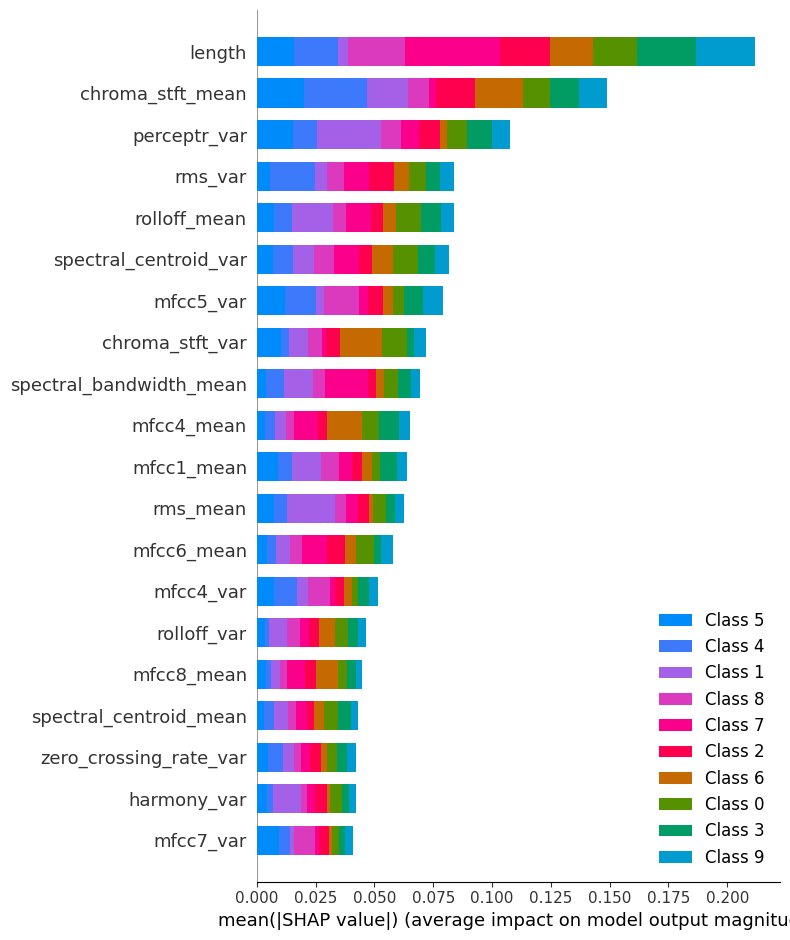

In [ ]:
import os
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score
from lime.lime_tabular import LimeTabularExplainer
import shap

# Download dataset path via kagglehub
path = kagglehub.dataset_download("andradaolteanu/gtzan-dataset-music-genre-classification")

# Load the CSV file, skip the first index column if present
data = pd.read_csv(os.path.join(path, 'Data', 'features_30_sec.csv'))
data = data.iloc[:, 1:]  # Remove the first column (index)

# Separate features and labels
X = data.drop(columns=['label'])
y = data['label']
feature_names = X.columns.tolist()
class_names = y.unique().tolist()

# Split dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)

# Train KNN model
knn_model = KNeighborsClassifier(n_neighbors=5)
knn_model.fit(X_train, y_train)

# Train Random Forest model
rf_model = RandomForestClassifier(n_estimators=100, random_state=42)
rf_model.fit(X_train, y_train)

# Predictions
knn_preds = knn_model.predict(X_test)
rf_preds = rf_model.predict(X_test)

# Print accuracy scores
print(f"KNN Accuracy: {accuracy_score(y_test, knn_preds):.2f}")
print(f"Random Forest Accuracy: {accuracy_score(y_test, rf_preds):.2f}")

# Initialize LIME explainers
knn_explainer = LimeTabularExplainer(
    training_data=X_train.values,
    feature_names=feature_names,
    class_names=class_names,
    discretize_continuous=True
)

rf_explainer = LimeTabularExplainer(
    training_data=X_train.values,
    feature_names=feature_names,
    class_names=class_names,
    discretize_continuous=True
)

# Function wrappers for predict_proba with correct DataFrame input for LIME
def knn_predict_proba(x):
    df = pd.DataFrame(x, columns=feature_names)
    return knn_model.predict_proba(df)

def rf_predict_proba(x):
    df = pd.DataFrame(x, columns=feature_names)
    return rf_model.predict_proba(df)

# Explain first test instance using LIME
knn_exp = knn_explainer.explain_instance(
    data_row=X_test.iloc[0].values,
    predict_fn=knn_predict_proba,
    num_features=10
)

rf_exp = rf_explainer.explain_instance(
    data_row=X_test.iloc[0].values,
    predict_fn=rf_predict_proba,
    num_features=10
)

# Print LIME explanations nicely
print("\nLIME Explanation for KNN model (first test instance):")
for feature, weight in knn_exp.as_list():
    print(f"{feature}: {weight:.4f}")

print("\nLIME Explanation for Random Forest model (first test instance):")
for feature, weight in rf_exp.as_list():
    print(f"{feature}: {weight:.4f}")

# SHAP explanation for Random Forest
print("\nComputing SHAP values for Random Forest model...")

# Create SHAP explainer and calculate SHAP values
shap_explainer = shap.TreeExplainer(rf_model)
shap_values = shap_explainer.shap_values(X_test)

# Display SHAP summary plot (bar plot for feature importance)
shap.summary_plot(shap_values, X_test, plot_type="bar", show=True)


In [ ]:
pip install playsound

In [ ]:
# User inputs a music genre, then 5 random music files from that genre are selected and played

import os
import random
from IPython.display import Audio, display

# Root path to GTZAN audio dataset
audio_data_path = '/kaggle/input/gtzan-dataset-music-genre-classification/Data/genres_original'

def play_multiple_genre_audios(genre_name, num_audios=5):
    genre_folder = os.path.join(audio_data_path, genre_name.lower())
    if not os.path.exists(genre_folder):
        print(f"Genre '{genre_name}' not found. Available genres:")
        print(os.listdir(audio_data_path))
        return

    audio_files = [f for f in os.listdir(genre_folder) if f.endswith('.wav')]
    if not audio_files:
        print(f"No audio files found in genre folder '{genre_name}'.")
        return

    # Pick num_audios random audio files without replacement (or all if less than num_audios)
    selected_files = random.sample(audio_files, min(num_audios, len(audio_files)))

    print(f"Playing {len(selected_files)} random audio files from genre '{genre_name}':")

    for audio_file in selected_files:
        audio_path = os.path.join(genre_folder, audio_file)
        print(f"Playing: {audio_file}")
        display(Audio(audio_path))
        # Optional: pause between audios or just play inline one after another

# Input from user
genre = input("Enter a genre (e.g., rock, blues, classical): ").strip()
play_multiple_genre_audios(genre)


Enter a genre (e.g., rock, blues, classical): hiphop
Playing 5 random audio files from genre 'hiphop':
Playing: hiphop.00046.wav


Playing: hiphop.00013.wav


Playing: hiphop.00067.wav


Playing: hiphop.00054.wav


Playing: hiphop.00056.wav


In [ ]:
#Updated model accuracy

# Define the parameter grid to search over
param_grid = {
    'n_estimators': [50, 100, 200],
    'max_depth': [None, 10, 20, 30]
}

# Initialize the Random Forest model
rf = RandomForestClassifier(random_state=42)

# Setup GridSearchCV with 5-fold cross-validation
grid_search = GridSearchCV(estimator=rf, param_grid=param_grid, cv=5, n_jobs=-1, verbose=2)

# Fit on training data
grid_search.fit(X_train, y_train)

# Best parameters found
print("Best Parameters:", grid_search.best_params_)

# Use the best model to predict test data
best_rf = grid_search.best_estimator_
y_pred = best_rf.predict(X_test)

# Calculate and print accuracy
accuracy = accuracy_score(y_test, y_pred)
print(f"Updated Model Accuracy: {accuracy * 100:.2f}%")


Fitting 5 folds for each of 12 candidates, totalling 60 fits
Best Parameters: {'max_depth': 20, 'n_estimators': 200}
Updated Model Accuracy: 78.50%
